In [20]:
import sys
sys.path.insert(0, '/cndd/fangming/CEMBA/snmcseq_dev')
import tqdm
from matplotlib.cm import get_cmap
import fbpca

from __init__ import *
from __init__jupyterlab import *
import snmcseq_utils

In [ ]:
today = datetime.date.today()
figures = './figures/{}_{{}}'.format(today)
figures

# Read in data 

In [21]:
DATA_DIR = '/datasets/Public_Datasets/Vizgen_MERFISH_mouse_brain'
data_dir = DATA_DIR

In [22]:
slicenames = [
    "Slice1",
    "Slice2",
    "Slice3",
]
replicates = [
    "Replicate1",
    "Replicate2",
    "Replicate3",
]
ti = time.time()

alldata = {}
cell_covs = {}

i = 0
for slicename in slicenames:
    for replicate in replicates:
        sample_name = '{}_{}'.format(slicename, replicate)
        print(sample_name)
        fdata = os.path.join(data_dir, '{}/{}/cell_by_gene.csv'.format(slicename, replicate))
        fmeta = os.path.join(data_dir, '{}/{}/cell_metadata.csv'.format(slicename, replicate))

        # read in
        data = pd.read_csv(fdata, index_col=0)
        meta = pd.read_csv(fmeta, index_col=0)
        data = data.drop(data.filter(regex='^Blank-').columns, axis=1)
        if i == 0:
            genes = data.columns
        else:
            assert np.all(genes == data.columns)
            
        # process
        cell_cov = data.sum(axis=1)
        meta['cell_cov'] = cell_cov
        data_norm = data.divide(cell_cov, axis=0)
        data_comb = meta.join(data_norm)
        
        # record
        i += 1
        alldata[sample_name] = data_comb
        cell_covs[sample_name] = cell_cov
        print(time.time()-ti)

Slice1_Replicate1
11.81706166267395
Slice1_Replicate2
28.169313430786133
Slice1_Replicate3
41.48106408119202
Slice2_Replicate1
53.09656500816345
Slice2_Replicate2
67.31627058982849
Slice2_Replicate3
79.9171495437622
Slice3_Replicate1
88.92859292030334
Slice3_Replicate2
100.00232028961182
Slice3_Replicate3
109.10364937782288


# Coverage

/cndd2/fangming/venvs/routine/lib/python3.8/site-packages/IPython/core/pylabtools.py:132: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


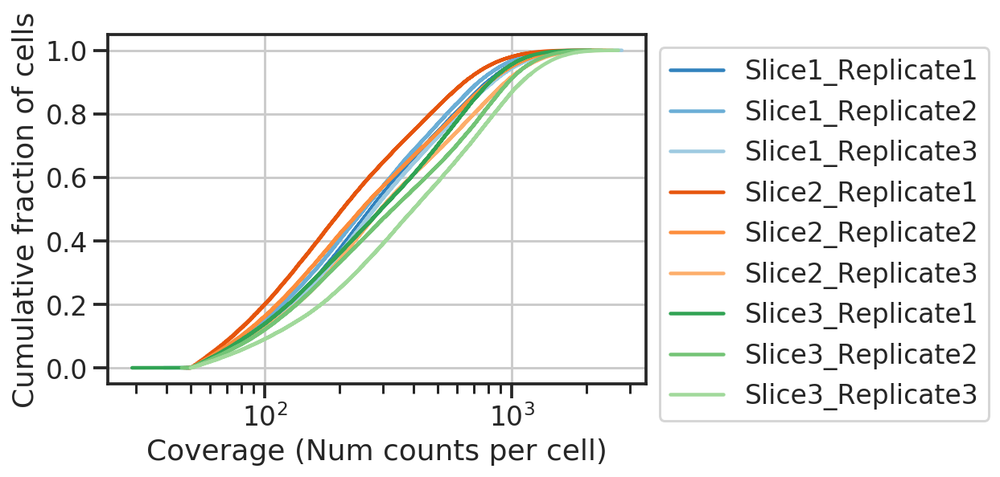

In [23]:
colors = [
    get_cmap('tab20c').colors[0],
    get_cmap('tab20c').colors[1],
    get_cmap('tab20c').colors[2],
    
    get_cmap('tab20c').colors[4],
    get_cmap('tab20c').colors[5],
    get_cmap('tab20c').colors[6],
    
    get_cmap('tab20c').colors[8],
    get_cmap('tab20c').colors[9],
    get_cmap('tab20c').colors[10],
] 
palette = {}
for i, sample in enumerate(alldata.keys()):
    palette[sample] = colors[i] 

fig, ax = plt.subplots()
for sample in alldata.keys():
    color = palette[sample]
    cell_cov = cell_covs[sample]
    med = cell_cov.median()
    snmcseq_utils.gen_cdf(cell_cov, ax=ax, label=sample, color=color)
#     sns.distplot(cell_cov, ax=ax, label=sample_name, color=color, )
#     ax.axvline(med, color=color, linestyle='--')
    
ax.set
ax.legend(bbox_to_anchor=(1,1))
ax.set_xscale('log')
ax.set_xlabel('Coverage (Num counts per cell)')
ax.set_ylabel('Cumulative fraction of cells')
plt.show()

# Visualize 

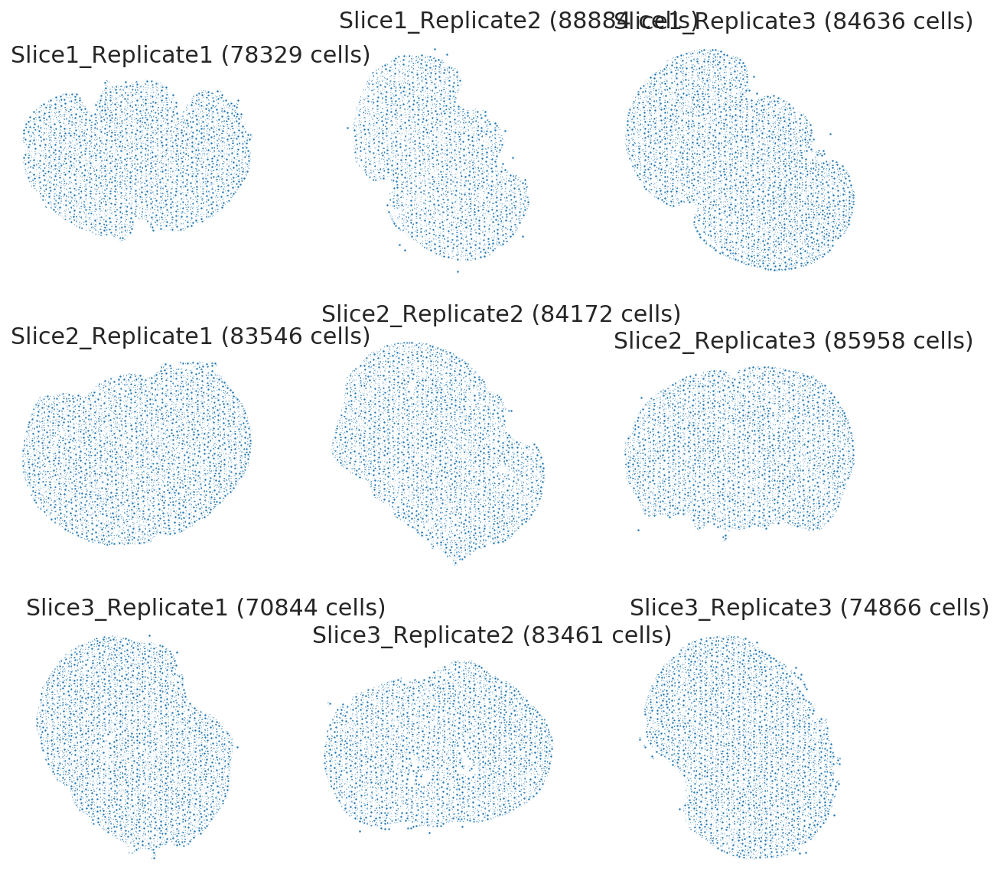

In [5]:
fig, axs = plt.subplots(3, 3, figsize=(10,10))
for ax, sample in zip(axs.flat, alldata.keys()):
    toplot = alldata[sample]
    sns.scatterplot(x='center_x', y='center_y', data=toplot, 
                    s=4, markers=dict(marker_edge_color='none'),
                    rasterized=True,
                    ax=ax,
                   )
    ax.axis('off')
    ax.set_aspect('equal')
    ax.set_title("{} ({} cells)".format(sample, len(toplot)), loc='left', fontsize=15)
plt.show()

# Rotation 

In [24]:
# rotation transformation
def rotate(mat, vec_chiral):
    """(n,2) matrix as input
    """
    U, s, Vt = fbpca.pca(mat, k=2)
    coords = U.dot(np.diag(s))

    # det = -1 reflection; det = 1 rotation
    if np.linalg.det(Vt) < 0: # ~ -1
        coords[:,0] = -coords[:,0]
        Vt[0,:] = -Vt[0,:]
        
    delta = vec_chiral[coords[:,1]>0].sum() - vec_chiral[coords[:,1]<0].sum()
    if delta < 0: # rotate 180 
        coords = -coords
        Vt = -Vt
    return coords, Vt

In [25]:
all_Vts = {}
for sample in alldata.keys():
    toplot = alldata[sample]
    toplot[['x', 'y']], Vt = rotate(toplot[['center_x', 'center_y']].values, toplot['Met'].values)
    all_Vts[sample] = Vt

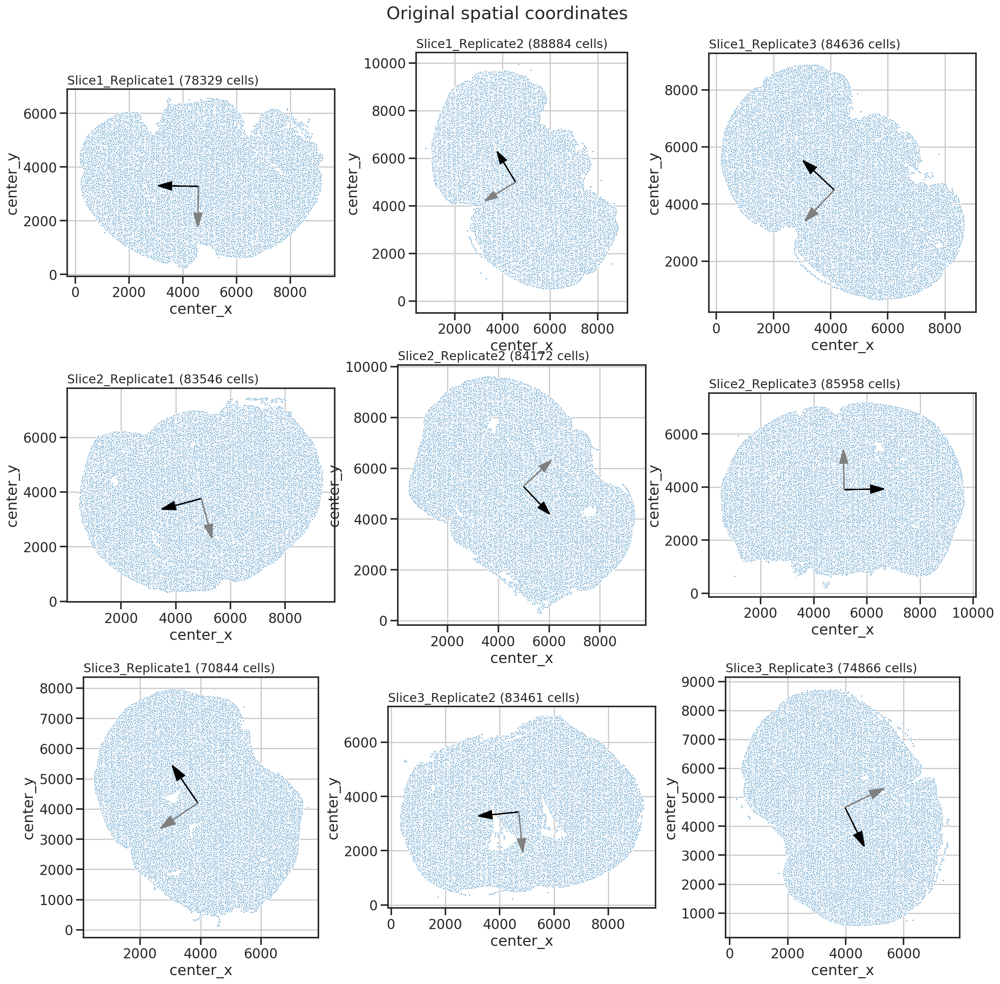

In [8]:
x, y, suptitle = 'center_x', 'center_y', 'Original spatial coordinates'
fig, axs = plt.subplots(3, 3, figsize=(20,20))
for i, (ax, sample) in enumerate(zip(axs.flat, alldata.keys())):
    toplot = alldata[sample]
    Vt = all_Vts[sample]
    
    sns.scatterplot(x=x, y=y, data=toplot, 
                    s=4, markers=dict(marker_edge_color='none'),
                    rasterized=True,
                    ax=ax,
                   )
    ax.set_aspect('equal')
    xmean, ymean = toplot[x].mean(), toplot[y].mean()
    scale = 1000
    ax.arrow(xmean, ymean, scale*Vt[0,0], scale*Vt[0,1], 
             head_width=0.3*scale, head_length=0.5*scale, fc='k', ec='k')
    ax.arrow(xmean, ymean, scale*Vt[1,0], scale*Vt[1,1], 
             head_width=0.3*scale, head_length=0.5*scale, fc='gray', ec='gray')
    ax.set_title("{} ({} cells)".format(sample, len(toplot)), loc='left', fontsize=15)
fig.suptitle(suptitle, y=0.92)
plt.show()

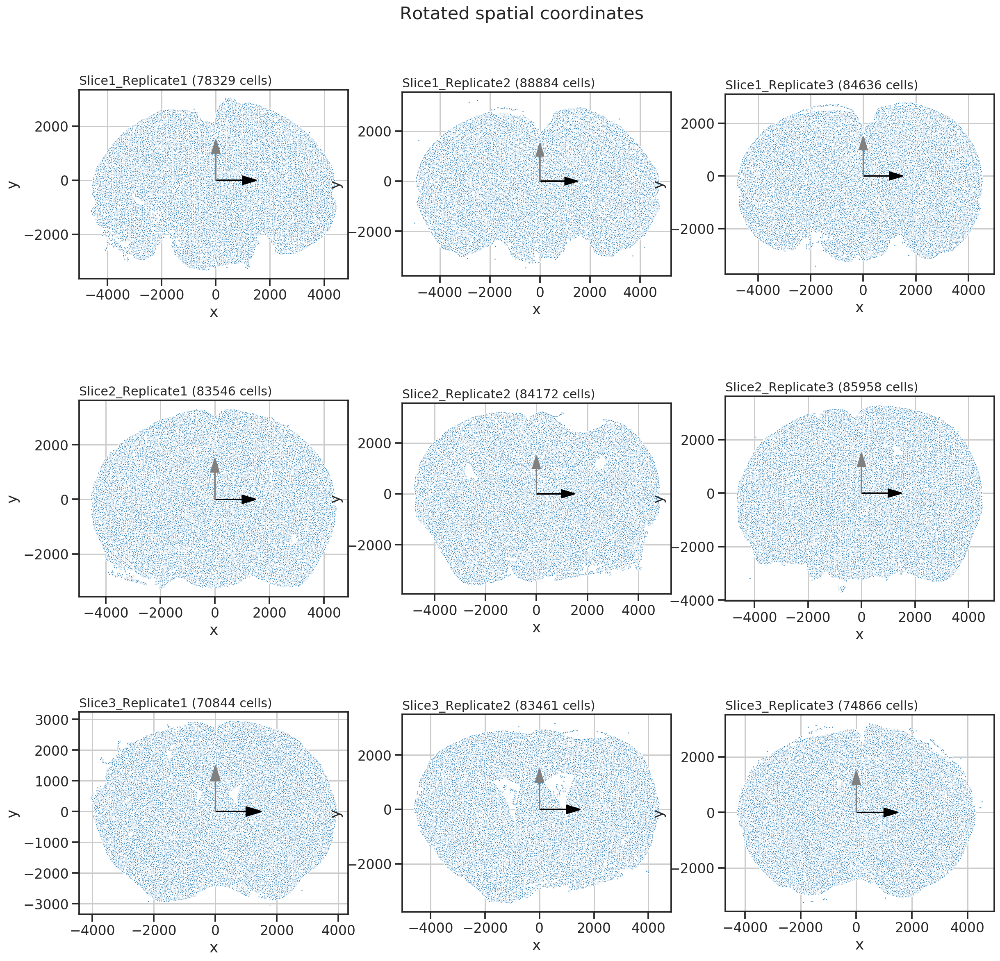

In [9]:
x, y, suptitle = 'x', 'y', 'Rotated spatial coordinates'
fig, axs = plt.subplots(3, 3, figsize=(20,20))
for i, (ax, sample) in enumerate(zip(axs.flat, alldata.keys())):
    toplot = alldata[sample]
    Vt = all_Vts[sample]
    Vt = Vt.dot(Vt.T)
    
    sns.scatterplot(x=x, y=y, data=toplot, 
                    s=4, markers=dict(marker_edge_color='none'),
                    rasterized=True,
                    ax=ax,
                   )
    ax.set_aspect('equal')
    xmean, ymean = toplot[x].mean(), toplot[y].mean()
    scale = 1000
    ax.arrow(xmean, ymean, scale*Vt[0,0], scale*Vt[0,1], 
             head_width=0.3*scale, head_length=0.5*scale, fc='k', ec='k')
    ax.arrow(xmean, ymean, scale*Vt[1,0], scale*Vt[1,1], 
             head_width=0.3*scale, head_length=0.5*scale, fc='gray', ec='gray')
    ax.set_title("{} ({} cells)".format(sample, len(toplot)), loc='left', fontsize=15)
fig.suptitle(suptitle, y=0.92)
plt.show()

# Visualize genes

In [10]:
ndownsamp = 40000
downsampled_data = {}
for sample in alldata.keys():
    downsampled_data[sample] = alldata[sample].sample(n=ndownsamp)

In [11]:
def plot_FISH(gene):
    output = '{}/{}_{}.png'.format(output_dir, sample_name, gene)
#     print(output)
    
    fig, axs = plt.subplots(3, 3, figsize=(15,15))
    cax = fig.add_axes([0.95, 0.7, 0.02, 0.1])
    for i, (ax, sample) in enumerate(zip(axs.flat, alldata.keys())):
#         toplot = downsampled_data[sample]
        toplot = alldata[sample]
        vmaxp = 99
        vmin, vmax = 0, np.percentile(toplot[gene], vmaxp)
        x, y = 'x', 'y'
        sns.scatterplot(x=x, y=y, hue=gene, data=toplot, 
                        s=1, linewidth=0, alpha=0.3,
                        legend=False, 
                        rasterized=True, 
                        vmin=vmin, 
                        vmax=vmax,
                        ax=ax,
                       )
        sns.scatterplot(x=x, y=y, hue=gene, data=toplot[toplot[gene]>0], 
                        s=3, linewidth=0, alpha=1,
                        legend=False,
                        rasterized=True, 
                        vmin=vmin, 
                        vmax=vmax,
                        ax=ax,
                       )
        ax.axis('off')
        ax.set_aspect('equal')
        ax.set_title("{}".format(sample), loc='left', fontsize=15)
        
    # colorbar
    norm = plt.Normalize(0, vmaxp)
    sm = plt.cm.ScalarMappable(cmap="rocket_r", norm=norm,)
    fig.colorbar(sm, cax=cax, label='Percentile per slice', ticks=[0, vmaxp])

    fig.suptitle(gene, y=0.92, fontsize=18)
    

  0%|          | 0/483 [00:07<?, ?it/s]

7.625665903091431


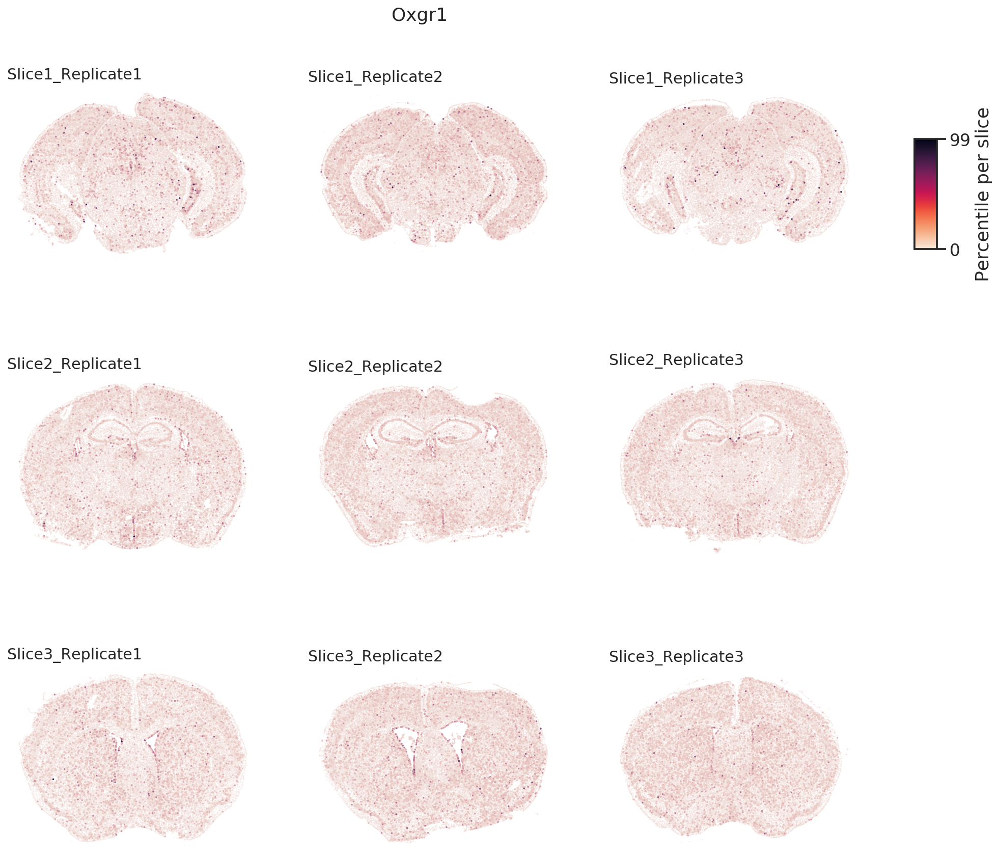

In [13]:
output_dir = './results_may1'
if not os.path.isdir(output_dir):
    os.makedirs(output_dir)

ti = time.time()
for gene in tqdm.tqdm(genes):
    plot_FISH(gene)
    print(time.time()-ti)
    break

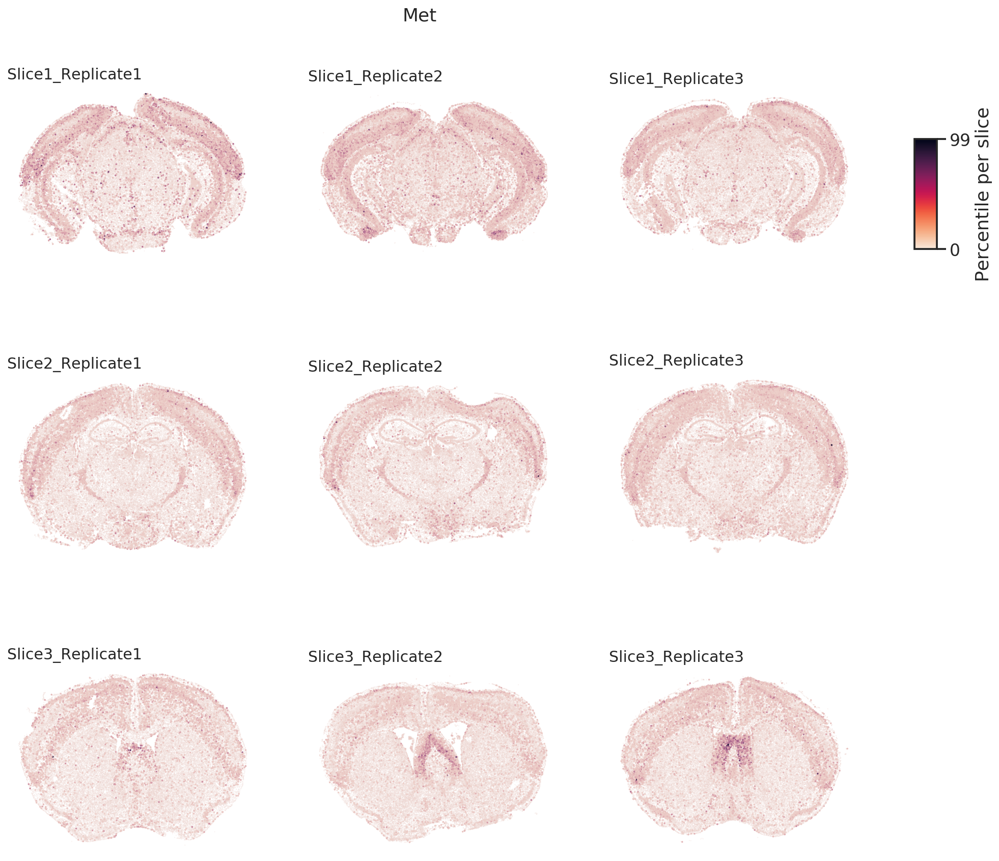

In [14]:
plot_FISH('Met')

# Save progress (2 files for each slice)

- palette
- normalized data combined with meta and rotated coordinates (X') (hdf5)
- the rotation matrices (X=X'Vt)

In [31]:

# # run only once
# for sample in alldata.keys():
#     oldorder = alldata[sample].columns
#     neworder = oldorder[-2:].tolist() + oldorder[:-2].tolist()
#     alldata[sample] = alldata[sample][neworder]
#     print(sample)

In [32]:
alldata[sample]

,x,y,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
102664563492900048462363937849459428087,-2858.525385,-2565.174049,12,825.112453,416.766612,6086.123983,412.441212,421.092012,6076.717182,6095.530783,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.015873,0.000000
248024456595654429600598295124535343200,-2816.939692,-2585.356593,12,460.431146,416.982612,6039.899981,412.873212,421.092012,6033.949181,6045.850782,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.008547,0.000000,0.000000,0.000000
248517492611370834464009662840236881305,-2824.661196,-2589.319193,12,1489.933543,410.022012,6045.083982,401.209212,418.834812,6033.625181,6056.542782,...,0.006024,0.003012,0.000000,0.000000,0.000000,0.0,0.033133,0.000000,0.000000,0.000000
267194455595590501971330204981279503222,-2831.013698,-2582.409286,12,432.760783,413.424012,6053.831982,409.741212,417.106812,6048.313182,6059.350782,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000
80719596629301901340444638136238672607,-2851.685262,-2569.008578,12,297.297646,416.340012,6078.293982,412.765212,419.914812,6074.233182,6082.354783,...,0.000000,0.000000,0.000000,0.000000,0.012987,0.0,0.000000,0.000000,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
83937024964201848283016757593780771226,2774.964921,2597.764624,1250,373.784913,7534.349800,3305.448106,7528.777000,7539.922600,3299.821306,3311.074906,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.012346,0.000000,0.000000
148061363998535362576313499528909269288,2843.513511,2440.649906,1251,1703.899137,7423.541797,3174.659995,7415.808997,7431.274598,3163.309194,3186.010795,...,0.008197,0.005464,0.000000,0.002732,0.002732,0.0,0.010929,0.000000,0.000000,0.013661
168617013943630042988612365185875818858,2935.049991,2385.468025,1251,1291.271177,7414.361797,3068.171992,7407.384997,7421.338597,3056.929192,3079.414792,...,0.000000,0.000000,0.008065,0.000000,0.000000,0.0,0.000000,0.040323,0.024194,0.000000
203611860594164043360467266582230396043,2917.615374,2391.984892,1251,1295.668972,7412.525797,3086.693992,7405.008997,7420.042597,3074.857192,3098.530793,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.034965,0.027972,0.000000


In [68]:
import json
# save palette as json
file = './data/palette.json'
with open(file, 'w') as f:
    json.dump(palette, f)

In [70]:
with open(file, 'r') as f:
    palette = json.load(f)
palette

{'Slice1_Replicate1': [0.19215686274509805,
  0.5098039215686274,
  0.7411764705882353],
 'Slice1_Replicate2': [0.4196078431372549,
  0.6823529411764706,
  0.8392156862745098],
 'Slice1_Replicate3': [0.6196078431372549,
  0.792156862745098,
  0.8823529411764706],
 'Slice2_Replicate1': [0.9019607843137255,
  0.3333333333333333,
  0.050980392156862744],
 'Slice2_Replicate2': [0.9921568627450981,
  0.5529411764705883,
  0.23529411764705882],
 'Slice2_Replicate3': [0.9921568627450981,
  0.6823529411764706,
  0.4196078431372549],
 'Slice3_Replicate1': [0.19215686274509805,
  0.6392156862745098,
  0.32941176470588235],
 'Slice3_Replicate2': [0.4549019607843137,
  0.7686274509803922,
  0.4627450980392157],
 'Slice3_Replicate3': [0.6313725490196078,
  0.8509803921568627,
  0.6078431372549019]}

In [53]:
# save alldata and rotation matrices as hdf5
import h5py
file = './data/processed_vizgen_merfish_may1_2021.h5ad'
for sample in alldata.keys():
    with h5py.File(file, 'a') as f:
        f['Vt_'+sample] = all_Vts[sample]
    alldata[sample].to_hdf(file, 'data_'+sample, 'a')

In [54]:
with h5py.File(file, 'r') as f:
    print(f.keys())

<KeysViewHDF5 ['Vt_Slice1_Replicate1', 'Vt_Slice1_Replicate2', 'Vt_Slice1_Replicate3', 'Vt_Slice2_Replicate1', 'Vt_Slice2_Replicate2', 'Vt_Slice2_Replicate3', 'Vt_Slice3_Replicate1', 'Vt_Slice3_Replicate2', 'Vt_Slice3_Replicate3', 'data_Slice1_Replicate1', 'data_Slice1_Replicate2', 'data_Slice1_Replicate3', 'data_Slice2_Replicate1', 'data_Slice2_Replicate2', 'data_Slice2_Replicate3', 'data_Slice3_Replicate1', 'data_Slice3_Replicate2', 'data_Slice3_Replicate3']>


In [55]:
df = pd.read_hdf(file, 'data_Slice1_Replicate1')
df

,x,y,fov,volume,center_x,center_y,min_x,max_x,min_y,max_y,...,Pdgfrb,Ptk7,Ret,Ror1,Ror2,Ros1,Ryk,Tek,Tie1,Tyro3
110883424764611924400221639916314253469,4441.118092,-918.994851,0,432.141425,156.563284,4271.326432,151.530484,161.596084,4264.619632,4278.033232,...,0.014706,0.000000,0.000000,0.000000,0.000000,0.0,0.029412,0.000000,0.000000,0.00000
135188247894899244046039873973964001182,4440.923793,-904.632063,0,1351.802616,156.509284,4256.962431,148.290484,164.728084,4247.663631,4266.261232,...,0.000000,0.000000,0.000000,0.005650,0.000000,0.0,0.005650,0.000000,0.000000,0.00565
164766962839370328502017156371562646881,4436.970793,-875.914102,0,1080.653268,159.965284,4228.180431,152.178484,167.752084,4220.555630,4235.805231,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.005618,0.028090,0.044944,0.00000
165747897693809971960756442245389760838,4431.011961,-971.719421,0,1652.000749,167.579284,4323.868433,158.226484,176.932084,4314.191633,4333.545233,...,0.005025,0.005025,0.002513,0.002513,0.005025,0.0,0.020101,0.002513,0.005025,0.00000
260943245639750847364278545493286724628,4437.770486,-956.534326,0,1343.378642,160.559284,4308.802433,152.394484,168.724084,4301.231633,4316.373233,...,0.003311,0.000000,0.013245,0.000000,0.000000,0.0,0.006623,0.006623,0.009934,0.00000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
165273009496786595275688065919008183969,-4551.971020,-1248.697666,1225,1159.623218,9154.007886,4445.528506,9143.953086,9164.062686,4435.473706,4455.583306,...,0.011765,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.011765,0.00000
250474226357477911702383283537224741401,-4487.179861,-1225.758280,1225,1058.062257,9088.829884,4423.712505,9081.097084,9096.562685,4416.249705,4431.175306,...,0.012658,0.002532,0.000000,0.002532,0.000000,0.0,0.002532,0.000000,0.000000,0.00000
66106840181174834341279408890707577820,-4568.460616,-1235.210684,1225,1155.306779,9170.261887,4431.758506,9159.613086,9180.910687,4421.217705,4442.299306,...,0.000000,0.000000,0.000000,0.007194,0.021583,0.0,0.000000,0.000000,0.007194,0.00000
66165211106933093510165165316573672348,-4484.650001,-1219.017543,1225,394.808108,9086.183884,4417.016505,9081.745084,9090.622685,4412.253705,4421.779305,...,0.006944,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.027778,0.006944,0.00000
